## Loading packages

In [83]:
import os

#import matplotlib.pyplot as plt  # used for plotting
#import numpy as np               # used for calculations
import pandas as pd              # used for data handling
import plotly.express as px      # used for performant plotting
import seaborn as sns            # used for plotting
#import sklearn.tree as skt       # used for decision tree modeling

## Loading the dataset

The dataset is available online in form of two `csv` files.
Source: tba

In [30]:
path_data = os.path.join("..", "data", "_assets", "act2")

df_processes = pd.read_csv(os.path.join(path_data, "simulated_machine_data.csv"))
df_inspections = pd.read_csv(os.path.join(path_data, "simulated_inspection_data.csv"))

## Quick check data integrity

In [31]:
df_processes

,nr_iteration,process_step_index,timestamp,air_temperature_C,process_speed_mm_s,pressure_measured_bar,pressure_setting_bar,machine_temperature_C
0,0,0,2024-06-01 21:00:00.000,17.411810,10,10.627852,5,17.412460
1,0,0,2024-06-01 21:00:00.200,17.411810,10,9.779614,5,17.413841
2,0,0,2024-06-01 21:00:00.400,17.411810,10,9.821185,5,17.413659
3,0,0,2024-06-01 21:00:00.600,17.411810,10,11.627193,5,17.414430
4,0,0,2024-06-01 21:00:00.800,17.411810,10,9.973859,5,17.413691
...,...,...,...,...,...,...,...,...
199995,4999,2,2024-06-02 08:06:39.000,20.261769,20,30.323894,20,44.965510
199996,4999,2,2024-06-02 08:06:39.200,20.261769,20,23.571950,20,44.966815
199997,4999,2,2024-06-02 08:06:39.400,20.261769,20,27.522979,20,44.964251
199998,4999,2,2024-06-02 08:06:39.600,20.261769,20,24.457730,20,44.961582


In [32]:
df_inspections

,timestamp,error_code
0,2024-06-01 21:00:10.473536,OK
1,2024-06-01 21:00:19.347711,OK
2,2024-06-01 21:00:27.068450,OK
3,2024-06-01 21:00:36.424301,OK
4,2024-06-01 21:00:43.490064,OK
...,...,...
4995,2024-06-02 08:06:09.308983,OK
4996,2024-06-02 08:06:20.157448,OK
4997,2024-06-02 08:06:27.889312,OK
4998,2024-06-02 08:06:36.556291,OK


In [33]:
df_processes.isna().sum()

nr_iteration             0
process_step_index       0
timestamp                0
air_temperature_C        0
process_speed_mm_s       0
pressure_measured_bar    0
pressure_setting_bar     0
machine_temperature_C    0
dtype: int64

In [34]:
df_inspections.isna().sum()

timestamp     0
error_code    0
dtype: int64

In [35]:
df_processes.duplicated().sum()

np.int64(0)

In [36]:
df_processes.describe().T

,count,mean,std,min,25%,50%,75%,max
nr_iteration,200000.0,2499.500000,1443.379253,0.000000,1249.750000,2499.500000,3749.250000,4999.000000
process_step_index,200000.0,0.625000,0.856959,0.000000,0.000000,0.000000,1.250000,2.000000
air_temperature_C,200000.0,13.240958,2.849175,10.000000,10.648648,12.539426,15.382514,20.261769
process_speed_mm_s,200000.0,11.375000,5.764941,1.000000,10.000000,10.000000,12.500000,20.000000
pressure_measured_bar,200000.0,27.633557,30.726862,3.077623,11.504035,13.688540,27.021814,115.187109
pressure_setting_bar,200000.0,20.625000,30.663318,5.000000,5.000000,5.000000,20.000000,100.000000
machine_temperature_C,200000.0,37.265011,4.308452,17.412460,36.361106,37.496181,38.578313,45.034743


In [37]:
df_processes.dtypes

nr_iteration               int64
process_step_index         int64
timestamp                 object
air_temperature_C        float64
process_speed_mm_s         int64
pressure_measured_bar    float64
pressure_setting_bar       int64
machine_temperature_C    float64
dtype: object

In [38]:
df_inspections.dtypes

timestamp     object
error_code    object
dtype: object

In [39]:
df_processes.nunique()

nr_iteration               5000
process_step_index            3
timestamp                200000
air_temperature_C           501
process_speed_mm_s            3
pressure_measured_bar    200000
pressure_setting_bar          3
machine_temperature_C    200000
dtype: int64

In [40]:
df_inspections.nunique()

timestamp     5000
error_code       5
dtype: int64

In [41]:
df_inspections["error_code"].value_counts()

error_code
OK       4638
NOK_4     279
NOK_2      51
NOK_1      29
NOK_3       3
Name: count, dtype: int64

NOK_3 seems to be hardly ever happening.
Let us mentally drop this error code for this investigation, since three samples give a very weak statistical basis and tend to distort plots.

In [42]:
CONTINUOUS_VARS = [
    "air_temperature_C",
    "process_speed_mm_s",
    "pressure_measured_bar",
    "pressure_setting_bar",
    "machine_temperature_C",
]

## Exploring continuous variables by simple plots

Here, we visualize the continuous variables (one by one) against the timestamp to get an idea of their temporal behavior.

In [ ]:
df_filtered = df_processes.query("nr_iteration < 1000").sort_values("timestamp")  # for performance reasons, we filter to the first 1000 cycles.

fig = px.line(
    df_filtered,
    x="timestamp",
    y=CONTINUOUS_VARS,
    facet_col="variable",
    facet_col_wrap=1,
    title="Continuous Variables Over Time"
)

fig.update_xaxes(matches='x')    # share x-axis zoom/pan
fig.update_yaxes(matches=None)   # do not share y-axis limits
fig.update_layout(height=1200)   # increase figure height (y axis size)

fig.show()


The plot is interactive.
Zoom in to see more details.
Observe that the set pressure is constant over time, while the measured pressure varies around the set pressure and also shows some systematic offset.

Let us investigate this difference between set and measured pressure in more detail.

Remember that we are working with a dataset that contains three process types?
Let us explore, whether the distributions of the continuous variables differ across these process types.

In [48]:
df_processes["pressure_difference_bar"] = df_processes["pressure_measured_bar"] - df_processes["pressure_setting_bar"]

<Axes: >

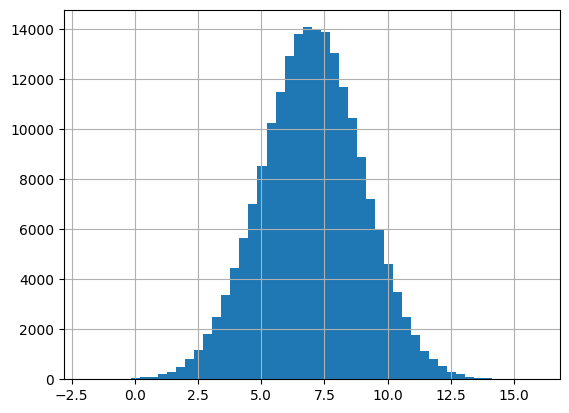

In [55]:
df_processes["pressure_difference_bar"].hist(bins=50)

In [57]:
df_processes["pressure_difference_bar"].mean()

np.float64(7.008556983420383)

Wir beobachten einen systematischen Offset von circa 7 bar und eine recht hohe Streuung.

## Aggregating plots

We are looking at iterations of the same, identical process.
Let us look at a plot where the processes overlap each other, colored by error code.

In [64]:
df_processes['process_inner_index'] = df_processes.sort_values('timestamp').groupby('nr_iteration').cumcount()

In [79]:
# Merge error_code from df_inspections into df_processes based on 'nr_iteration'
df_plot = df_processes.merge(
    df_inspections,
    left_on="nr_iteration",
    right_index=True,
    how="left"
)

fig = px.line(
    df_plot,
    x="process_inner_index",
    y="pressure_measured_bar",
    line_group="nr_iteration",
    color="error_code",
    title="Pressure per Iteration (Overlapped, Colored by Error Code)",
    labels={
        "process_inner_index": "Inner-process timestamp",
        "pressure_measured_bar": "Pressure (bar)",
        "error_code": "Error Code"
    },
)

# Set opacity: 0.01 for 'OK', 0.5 for others
for trace in fig.data:
    if trace.name == "OK":
        trace.opacity = 0.01
    else:
        trace.opacity = 0.5

fig.update_layout(showlegend=True)
fig.show()

In [81]:
# Aggregate: mean and std for each process_inner_index and error_code
agg_df = df_plot.groupby(['process_inner_index', 'error_code'])['pressure_measured_bar'].agg(['mean', 'std']).reset_index()

fig = px.line(
    agg_df,
    x="process_inner_index",
    y="mean",
    color="error_code",
    error_y="std",
    labels={
        "process_inner_index": "Inner-process timestamp",
        "mean": "Pressure (bar)",
        "error_code": "Error Code"
    },
    title="Mean Pressure per Error Code with Deviation"
)
fig.update_layout(legend_title_text='Error Code')
fig.show()


<Axes: xlabel='error_code', ylabel='mean'>

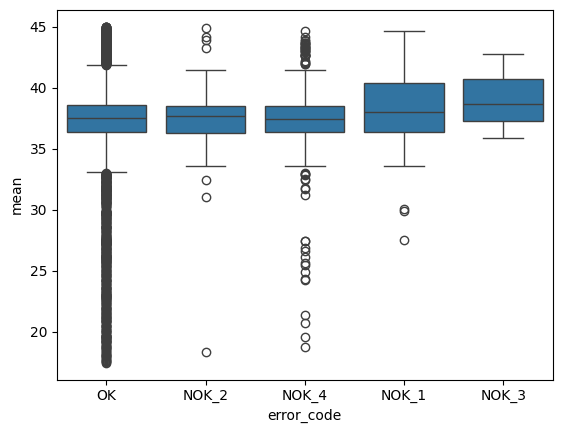

In [93]:
df_agg = df_plot.groupby(['nr_iteration', 'error_code'])['machine_temperature_C'].agg(['mean']).reset_index()

sns.boxplot(data=df_agg, y="mean", x='error_code')